In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats
from statistics import NormalDist

In [5]:
#Importing testing data
fullData = pd.read_csv("GPT-wiki-intro.csv")
gptDataSeries = fullData["generated_intro"]
humanDataSeries = fullData["wiki_intro"]
gpt_df = gptDataSeries.to_frame()
humanData_df = humanDataSeries.to_frame()
gpt_df = gpt_df.rename(columns={'generated_intro': 'text'})
humanData_df = humanData_df.rename(columns={'wiki_intro': 'text'})

In [6]:
#Function that returns the average lengths of all the sentences within a string
def average_sentence_length(text):
    lengths = 0
    count = 0
    sentences = text.split('.')
    for sentence in sentences:
        lengths += len(sentence)
        count += 1
    return lengths / count

In [7]:
#Adds column with data from the average_sentence_length() function:
gpt_df['avg_sentence_length'] = gpt_df.apply(lambda row: average_sentence_length(row['text']),axis=1)
humanData_df['avg_sentence_length'] = humanData_df.apply(lambda row: average_sentence_length(row['text']),axis=1)

# Results without conditioning, shows large difference between stats of GPT and Human data

## Descriptive Statistics:
### GPT:

In [8]:
gpt_df['avg_sentence_length'].describe()

count    150000.000000
mean         87.283082
std          25.026595
min           9.210526
25%          73.285714
50%          85.750000
75%          98.910985
max        1176.000000
Name: avg_sentence_length, dtype: float64

### Human:

In [9]:
humanData_df['avg_sentence_length'].describe()

count    150000.000000
mean        121.809221
std          88.147250
min          10.257143
25%          93.833333
50%         110.888889
75%         131.285714
max        3127.000000
Name: avg_sentence_length, dtype: float64

## Variability:

### GPT:

In [10]:
gpt_df['avg_sentence_length'].var()

626.3304704743197

### Human:

In [11]:
humanData_df['avg_sentence_length'].var()

7769.9377154305785

# Results within IQR

In [12]:
gpt_avgs = gpt_df['avg_sentence_length']
human_avgs = humanData_df['avg_sentence_length']
gpt_avgs = gpt_avgs[gpt_avgs.between(gpt_avgs.quantile(.15), gpt_avgs.quantile(.85))]
human_avgs = human_avgs[human_avgs.between(human_avgs.quantile(.15), human_avgs.quantile(.85))]

In [13]:
gpt_avgs.describe()

count    105038.000000
mean         86.019669
std          10.648825
min          66.666667
25%          77.333333
50%          85.750000
75%          94.500000
max         106.833333
Name: avg_sentence_length, dtype: float64

In [14]:
human_avgs.describe()

count    105025.000000
mean        112.051693
std          15.600288
min          85.312500
25%          99.250000
50%         110.888889
75%         124.071429
max         144.750000
Name: avg_sentence_length, dtype: float64

In [15]:
gpt_avgs.var()

113.39746532305534

In [16]:
human_avgs.var()

243.36899097535198

# Box plot to show the results

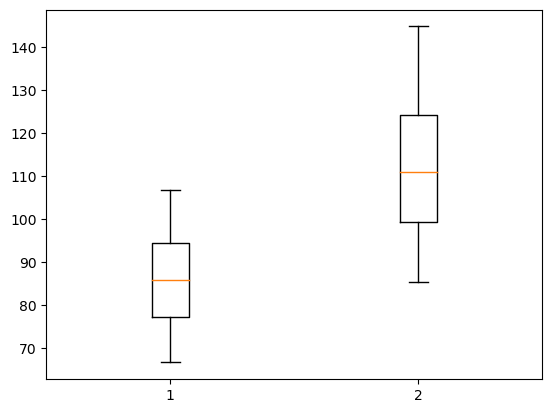

In [17]:
box_data = [gpt_avgs, human_avgs]
plt.boxplot(box_data)
plt.show()

# Can it may be possible to detect with some certaintity if the average length falls within the quartiles. Lets look at the data with the variablities


In [18]:
#Function that looks at the variability of sentence length within each response
def sentence_var(text):
    lengths = []
    sentences = text.split('.')
    for sentence in sentences:
        lengths.append(len(sentence))
    return np.var(lengths)

In [19]:
#Adds column with data from the sentence_var() function:
gpt_df['sentence_var'] = gpt_df.apply(lambda row: sentence_var(row['text']),axis=1)
humanData_df['sentence_var'] = humanData_df.apply(lambda row: sentence_var(row['text']),axis=1)

In [20]:
gpt_vars = gpt_df['sentence_var']
human_vars = humanData_df['sentence_var']
gpt_vars = gpt_avgs[gpt_avgs.between(gpt_avgs.quantile(.15), gpt_avgs.quantile(.85))]
human_vars = human_avgs[human_avgs.between(human_avgs.quantile(.15), human_avgs.quantile(.85))]

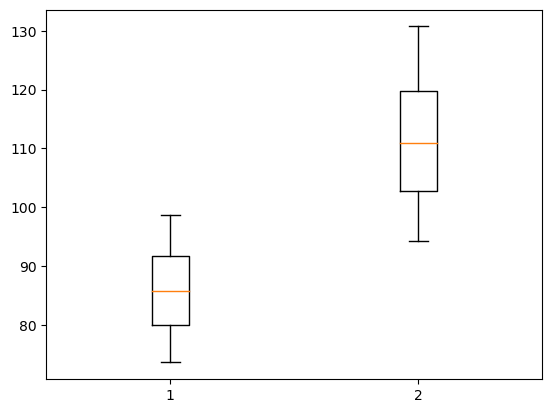

In [21]:
box_data = [gpt_vars, human_vars]
plt.boxplot(box_data)
plt.show()

# Large and discernable difference in variablity

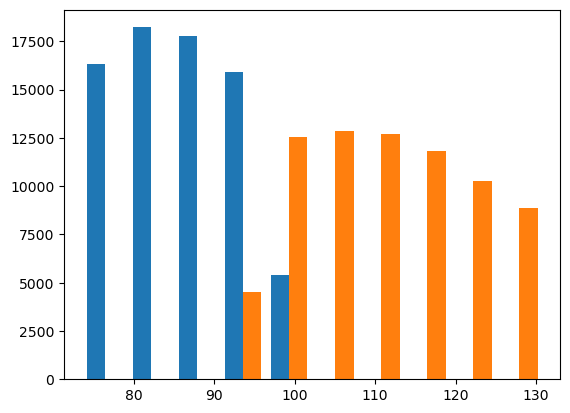

In [22]:
plt.hist(box_data)
plt.show()

# Fix the dataframe so we can make comparisons with the values of average word size and variability between word sizes

In [23]:
quantile_low = gpt_df['avg_sentence_length'].quantile(0.15)
quantile_hi  = gpt_df['avg_sentence_length'].quantile(0.85)

q_low_var = gpt_df['sentence_var'].quantile(0.15)
q_high_var = gpt_df['sentence_var'].quantile(0.85)

gpt_df_filtered = gpt_df[(gpt_df['avg_sentence_length'] < quantile_hi) &
                         (gpt_df['avg_sentence_length'] > quantile_low) &
                         (gpt_df['sentence_var'] > q_low_var) &
                          (gpt_df['sentence_var'] < q_high_var)]

In [24]:
quantile_low = humanData_df['avg_sentence_length'].quantile(0.15)
quantile_hi  = humanData_df['avg_sentence_length'].quantile(0.85)

q_low_var = humanData_df['sentence_var'].quantile(0.15)
q_high_var = humanData_df['sentence_var'].quantile(0.85)

humanData_filtered = humanData_df[(humanData_df['avg_sentence_length'] < quantile_hi) &
                                  (humanData_df['avg_sentence_length'] > quantile_low) &
                                  (humanData_df['sentence_var'] < q_high_var) &
                                  (humanData_df['sentence_var'] > q_low_var)]

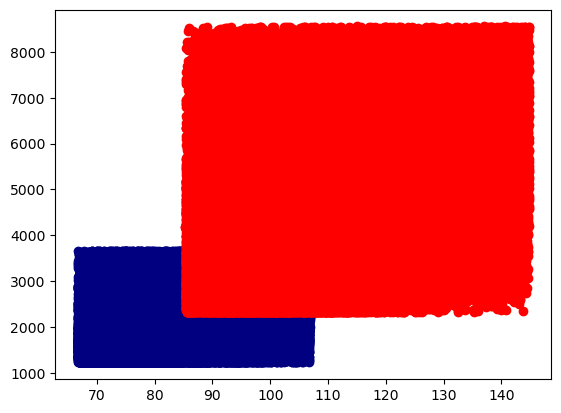

In [25]:
plt.scatter(x=gpt_df_filtered['avg_sentence_length'], y = gpt_df_filtered['sentence_var'], c = 'navy')
plt.scatter(x=humanData_filtered['avg_sentence_length'], y = humanData_filtered['sentence_var'], c = 'red')
plt.show()

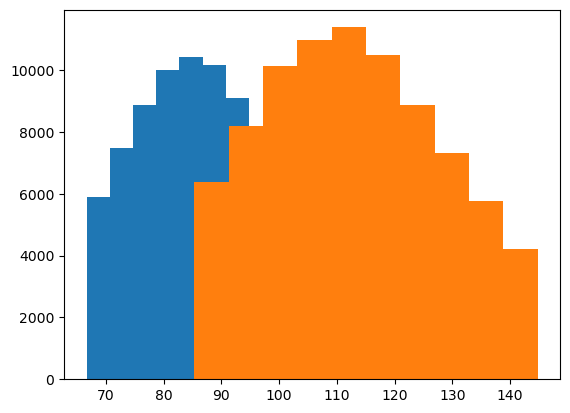

In [26]:
plt.hist(gpt_df_filtered['avg_sentence_length'])
plt.hist(humanData_filtered['avg_sentence_length'])
plt.show()

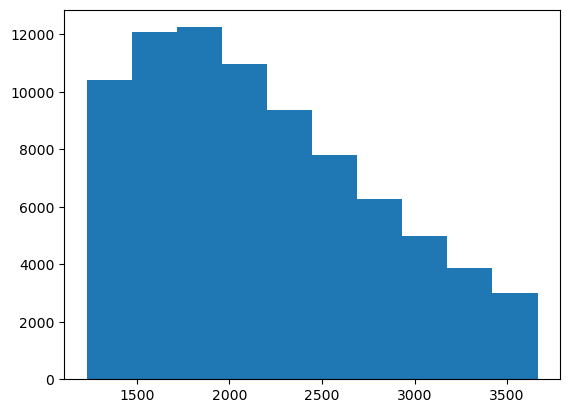

In [27]:
plt.hist(gpt_df_filtered['sentence_var'])
#plt.line(humanData_filtered['sentence_var'])
plt.show()

# It can be concluded that text can be detected as human written or generated by GPT via just sentence length and variability in word length

In [28]:
def is_gpt(text):
    avg_sent_len = average_sentence_length(text)
    print(avg_sent_len)
    sent_var = sentence_var(text)
    print(sent_var)
    if avg_sent_len < 100 and sent_var < 3000:
        return True
    else:
        return False

In [29]:
is_gpt("Once upon a time, there was a friendly golden retriever named Max. Max loved nothing more than going on walks with his owner, Sarah, and exploring the world around him. One day, as they were strolling through the neighborhood, Max spotted something new and exciting – a big, brightly-lit building with carts and people coming in and out of it. Curious, Max tugged at his leash and led Sarah towards the building. As they got closer, Max realized that it was a supermarket – a place where humans went to buy food and other things they needed. Max had never been inside a supermarket before, but he could smell all kinds of interesting things – fresh produce, meat, and cheese. Without hesitation, Max pulled Sarah towards the entrance and tried to walk inside. But as they got to the automatic doors, they didn't open. Sarah explained to Max that he wasn't allowed to go into the supermarket because he was a dog, not a person. Max was disappointed but didn't give up. He sat down outside the entrance and watched as people walked in and out with bags of groceries. As he watched, he noticed that some people had small dogs in their shopping carts, and others had dogs on leashes. Maybe he could go in after all!")

92.23076923076923
1496.3313609467457


True

# Now that there is a proof of concept I should use actual statistics to further improve accuracy

In [30]:
def get_probs(var, avgs, data_df):
    std_var = np.std(data_df['sentence_var'])
    mean_var = np.mean(data_df['sentence_var'])
    var_prob = NormalDist(mu=mean_var, sigma=std_var).pdf(var)

    std_avgs = np.std(data_df['avg_sentence_length'])
    mean_avgs = np.mean(data_df['avg_sentence_length'])
    avgs_prob = NormalDist(mu=mean_avgs, sigma=std_avgs).pdf(avgs)
    return var_prob, avgs_prob

In [31]:
def test_probs(text, data_df):
    var_z = average_sentence_length(text)
    avg_z = sentence_var(text)
    vp, ap = get_probs(var_z, avg_z, data_df)
    print('Prob Variability is: ' + str(vp))
    print('Prob Average is: ' + str(ap))

In [32]:
test_probs("Once upon a time, there was a friendly golden retriever named Max. Max loved nothing more than going on walks with his owner, Sarah, and exploring the world around him. One day, as they were strolling through the neighborhood, Max spotted something new and exciting – a big, brightly-lit building with carts and people coming in and out of it. Curious, Max tugged at his leash and led Sarah towards the building. As they got closer, Max realized that it was a supermarket – a place where humans went to buy food and other things they needed. Max had never been inside a supermarket before, but he could smell all kinds of interesting things – fresh produce, meat, and cheese. Without hesitation, Max pulled Sarah towards the entrance and tried to walk inside. But as they got to the automatic doors, they didn't open. Sarah explained to Max that he wasn't allowed to go into the supermarket because he was a dog, not a person. Max was disappointed but didn't give up. He sat down outside the entrance and watched as people walked in and out with bags of groceries. As he watched, he noticed that some people had small dogs in their shopping carts, and others had dogs on leashes. Maybe he could go in after all!", gpt_df_filtered)

Prob Variability is: 2.2009309343044933e-06
Prob Average is: 0.0


In [33]:
gpt_df_filtered.corr()

,avg_sentence_length,sentence_var
avg_sentence_length,1.000000,0.247485
sentence_var,0.247485,1.000000


In [34]:
humanData_filtered.corr()

,avg_sentence_length,sentence_var
avg_sentence_length,1.000000,0.345026
sentence_var,0.345026,1.000000


<AxesSubplot:ylabel='Density'>

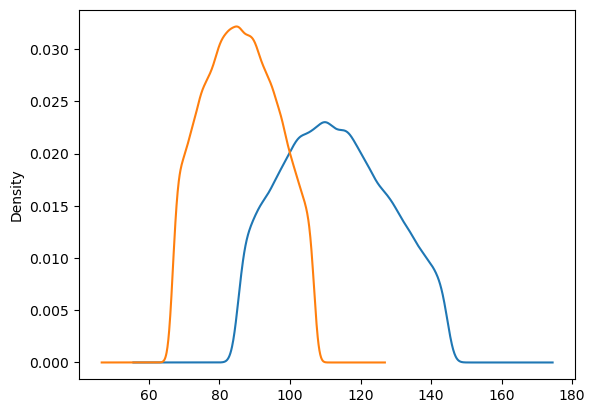

In [35]:
humanData_filtered['avg_sentence_length'].plot.kde()
gpt_df_filtered['avg_sentence_length'].plot.kde()

<AxesSubplot:ylabel='Density'>

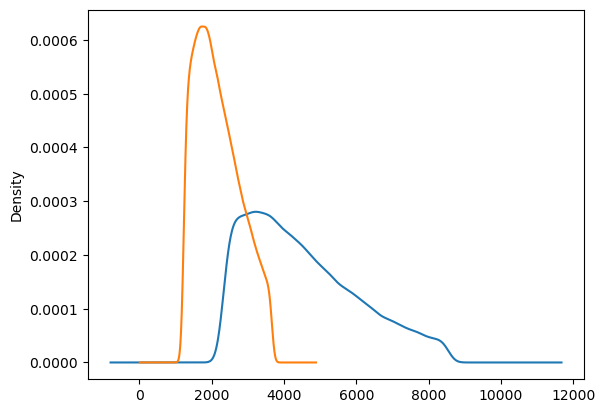

In [36]:
humanData_filtered['sentence_var'].plot.kde()
gpt_df_filtered['sentence_var'].plot.kde()

# Variance of the lengths of each word within each sentence

In [37]:
#Find the mean of the variance of word length in a sentence
def mean_word_length_variance(text):
    variances = []
    sentences = text.split('.')
    for sentence in sentences:
        holder = []
        words = sentence.split(' ')
        for word in words:
            holder.append(len(word))
        variances.append(np.var(holder))
    print(variances)
    return np.mean(variances)

In [38]:
mean_word_length_variance("Once upon a time, there was a friendly golden retriever named Max. Max loved nothing more than going on walks with his owner, Sarah, and exploring the world around him. One day, as they were strolling through the neighborhood, Max spotted something new and exciting – a big, brightly-lit building with carts and people coming in and out of it. Curious, Max tugged at his leash and led Sarah towards the building. As they got closer, Max realized that it was a supermarket – a place where humans went to buy food and other things they needed. Max had never been inside a supermarket before, but he could smell all kinds of interesting things – fresh produce, meat, and cheese. Without hesitation, Max pulled Sarah towards the entrance and tried to walk inside. But as they got to the automatic doors, they didn't open. Sarah explained to Max that he wasn't allowed to go into the supermarket because he was a dog, not a person. Max was disappointed but didn't give up. He sat down outside the entrance and watched as people walked in and out with bags of groceries. As he watched, he noticed that some people had small dogs in their shopping carts, and others had dogs on leashes. Maybe he could go in after all!")

[5.416666666666667, 3.8116343490304714, 9.648283038501566, 5.443786982248521, 5.729289940828401, 7.493055555555556, 7.285714285714286, 4.972222222222222, 7.225206611570249, 11.359375, 5.462603878116344, 4.630165289256198, 3.109375]


6.275952216900806

In [39]:
gpt_df_filtered['mean_word_length_variance'] = gpt_df_filtered.apply(lambda row: mean_word_length_variance(row['text']),axis=1)
humanData_filtered['mean_word_length_variance'] = humanData_filtered.apply(lambda row: mean_word_length_variance(row['text']),axis=1)

[4.671487603305785, 8.382222222222222, 5.778546712802768, 9.555555555555555, 10.842105263157896, 0.0]
[7.361111111111111, 6.14404432132964, 4.714285714285714, 7.583333333333333, 9.715555555555556, 0.0]
[3.84, 9.6875, 4.661625708884689, 7.30859375, 2.41522491349481, 2.1510416666666665, 7.25, 3.135802469135802, 7.086505190311419, 5.494897959183674, 0.0]
[27.888888888888886, 9.047500000000001, 13.09, 6.437869822485206, 10.415224913494809, 6.995555555555557, 10.859375, 5.950617283950618, 10.022160664819944, 7.668639053254437, 8.221453287197233, 0.0]
[7.408163265306122, 6.3520408163265305, 4.7528344671201825, 6.840000000000001, 3.609467455621302, 4.916666666666667, 6.942708333333333, 5.7164461247637055, 0.0]
[9.020833333333334, 7.289940828402366, 7.360544217687073, 6.6149584487534625, 9.827499999999999, 4.0275, 0.0]
[5.2077562326869815, 3.9028925619834705, 7.044982698961937, 5.297052154195011, 5.18359375, 0.0]
[4.637119113573408, 16.51530612244898, 10.21484375, 10.271468144044322, 0.0]
[4.7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[8.248888888888889, 5.493333333333333, 8.595555555555556, 9.991735537190083, 0.0]
[5.2383999999999995, 7.737024221453288, 7.866666666666666, 5.222222222222222, 8.154195011337865, 4.728888888888888, 6.5024, 5.410150891632372, 6.854400000000001, 7.964285714285714, 4.922495274102078, 0.0]
[17.537190082644628, 5.463137996219283, 5.514739229024943, 5.174603174603174, 4.54320987654321, 0.0, 10.666666666666666, 9.083333333333334, 4.082644628099174, 6.45408163265306, 0.0]
[5.2430555555555545, 8.140000000000002, 7.02734375, 4.774400000000001, 8.610000000000001, 11.16715976331361, 10.44, 0.0]
[3.1224489795918373, 11.8475, 5.260000000000001, 9.11357340720222, 0.0]
[7.673469387755101, 6.827499999999999, 8.692520775623269, 8.840236686390533, 6.946745562130176, 0.0]
[6.916666666666667, 5.066666666666666, 6.571428571428571, 6.8576, 5.973333333333334, 4.666666666666667, 4.544378698224853, 5.360544217687075, 7.090000000000001, 7.537414965986396, 5.805555555555555, 13.777777777777779, 5.162629757785466,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[13.234375, 9.984375, 10.402366863905327, 8.72108843537415, 10.674556213017752, 7.2622222222222215, 7.138888888888889, 4.83984375, 0.0]
[5.7687074829931975, 9.484375, 8.984375, 3.7438016528925617, 0.0]
[6.352941176470588, 2.9467455621301775, 6.861570247933886, 7.801020408163266, 12.276643990929708, 8.710059171597633, 5.591695501730104, 3.520661157024794, 0.0]
[5.71, 6.680272108843537, 3.6785714285714284, 5.7880859375, 7.940828402366863, 4.244897959183673, 7.576388888888888, 9.84504132231405, 11.780612244897961, 1.01, 0.0]
[8.5875, 9.82825484764543, 7.793388429752065, 11.262222222222224, 5.543252595155709, 7.664930555555557, 0.0]
[6.484429065743945, 4.0224, 6.765432098765432, 18.040000000000003, 8.571428571428571, 5.626666666666668, 6.670360110803325, 0.0]
[6.2117202268431, 1.8666666666666667, 5.222222222222222, 26.759999999999998, 8.453686200378073, 6.249851279000595, 7.582222222222223, 4.637755102040816, 9.771626297577855, 4.4375, 4.916099773242631, 4.521739130434782, 6.5, 7.388888888

/var/folders/qj/_h9kj67n2h383xn7tp2376l40000gn/T/ipykernel_59268/51133756.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpt_df_filtered['mean_word_length_variance'] = gpt_df_filtered.apply(lambda row: mean_word_length_variance(row['text']),axis=1)


[13.633217993079587, 12.076388888888888, 10.927499999999998, 6.8875, 8.206597222222221, 20.48979591836735, 0.2222222222222222, 4.0, 9.113854595336077, 9.795841209829868, 0.0]
[4.496913580246915, 5.831425598335069, 7.616071428571429, 7.74609375, 5.6875, 8.984375, 6.748724489795919, 4.109375, 5.575443786982248, 0.0]
[16.024691358024693, 6.994082840236687, 7.795847750865052, 6.622222222222223, 6.941015089163238, 6.107438016528925, 14.5, 18.387755102040817, 0.0]
[6.998109640831758, 6.239143367043427, 7.409722222222221, 10.489795918367347, 3.074792243767313, 6.006920415224914, 4.103806228373702, 8.266666666666667, 3.7539026629935726, 9.489999999999998, 4.488888888888889, 0.0]
[9.409722222222221, 10.2656, 5.6586888657648275, 8.611570247933885, 4.909722222222222, 5.4875, 8.454081632653061, 10.392857142857142, 9.170612244897958, 6.574759945130317, 11.359375, 0.0]
[5.6033057851239665, 6.693877551020408, 6.795847750865052, 3.9289940828402363, 7.30859375, 8.90234375, 9.484375, 11.473922902494332,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[9.498269896193774, 11.01, 11.81163434903047, 5.909722222222222, 9.14878892733564, 16.138888888888886, 9.37217598097503, 6.60166468489893, 9.034217608612071, 0.0]
[4.666666666666667, 7.674556213017751, 8.581314878892734, 7.777777777777778, 5.955555555555557, 6.907372400756144, 7.553875236294894, 20.620498614958443, 15.583333333333334, 4.916666666666667, 4.2975, 5.075255102040816, 5.668639053254438, 0.0]
[10.027777777777779, 12.743055555555557, 7.221329437545655, 12.666666666666666, 15.717451523545707, 6.5696, 4.395061728395062, 6.670360110803324, 16.0]
[9.244897959183673, 12.576177285318558, 9.63614744351962, 7.9234693877551, 4.89196675900277, 6.0246913580246915, 6.71280276816609, 5.14878892733564, 5.854934601664685, 0.0]
[7.138888888888889, 9.265306122448978, 13.94135802469136, 14.805555555555552, 6.559556786703601, 6.299643281807374, 3.3767258382642993, 5.4528061224489806, 0.0, 4.402366863905326, 12.154195011337869, 6.888888888888889, 5.840000000000002, 8.305363321799307, 0.0]
[8.289

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[16.06222222222222, 18.15976331360947, 6.150891632373113, 12.617283950617283, 11.640831758034025, 28.506666666666668, 10.552800734618916, 11.423469387755102, 6.359375, 0.0]
[13.94387755102041, 20.972222222222225, 6.90234375, 16.1024, 10.854442344045372, 3.85, 7.744400000000001, 4.155325443786983, 9.6474609375, 10.512396694214877, 9.55859375, 0.0]
[22.06222222222222, 6.817708333333333, 5.701368233194527, 7.003460207612457, 9.944214876033056, 4.4801097393689995, 7.410000000000001, 20.25]
[6.659279778393352, 3.58984375, 7.745152354570638, 8.484429065743946, 9.359375, 0.25, 9.71900826446281, 7.141274238227147, 9.138888888888891, 6.553600000000001, 4.576388888888889, 7.605231866825206, 4.563995837669095, 6.846880907372402, 0.0]
[7.839506172839506, 10.18140589569161, 6.863905325443787, 6.03957100591716, 9.0, 9.6820987654321, 5.026666666666666, 6.07638888888889]
[12.098765432098766, 11.146683673469386, 8.234375, 8.10207100591716, 10.443786982248522, 10.775510204081632, 0.0, 5.9375, 11.9442148

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[7.847500000000001, 9.716666666666667, 5.378858024691358, 7.07638888888889, 5.838842975206612, 8.1824, 10.199445983379501, 0.0]
[6.916666666666667, 6.066115702479338, 6.8055555555555545, 8.994082840236686, 24.469135802469136, 10.469135802469136, 5.040000000000001, 7.204389574759945, 6.444444444444445, 7.975206611570247, 9.719008264462811, 0.0]
[17.33884297520661, 0.0, 13.959183673469388, 12.366863905325447, 26.213017751479295, 27.358024691358025, 7.1211072664359865, 9.719135802469134, 16.740000000000002, 16.94, 12.605867346938776, 9.209183673469388, 0.0]
[11.8304, 11.756666666666668, 7.379962192816634, 6.65, 8.837370242214533, 8.955017301038064, 16.10666666666667, 14.9375, 11.963010204081632, 11.427514792899409, 8.594594594594595, 0.0]
[8.87130177514793, 12.467120181405894, 9.392857142857142, 5.471074380165289, 3.5474999999999985, 7.793388429752065, 21.360000000000003, 0.25, 5.204389574759945, 12.580261593341259, 0.0]
[6.1570247933884295, 7.7899305555555545, 11.058263971462543, 5.63269

/var/folders/qj/_h9kj67n2h383xn7tp2376l40000gn/T/ipykernel_59268/51133756.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  humanData_filtered['mean_word_length_variance'] = humanData_filtered.apply(lambda row: mean_word_length_variance(row['text']),axis=1)


# Implement Hypothesis testing


In [40]:
gpt_df_filtered.head()

,text,avg_sentence_length,sentence_var,mean_word_length_variance
0,Sexhow railway station was a railway station l...,73.833333,1687.138889,6.538320
1,"In Finnish folklore, all places and things, an...",79.333333,1421.222222,5.919722
4,"Robert Milner ""Rob"" Bradley, Jr. (born August ...",69.545455,1368.793388,4.821017
5,Moluccans are the Austronesian-speaking and Pa...,92.333333,1640.555556,9.716440
8,"""Pussy Fairy (OTW)"" (stylized as ""P*$$Y Fairy""...",85.222222,1555.728395,5.170925


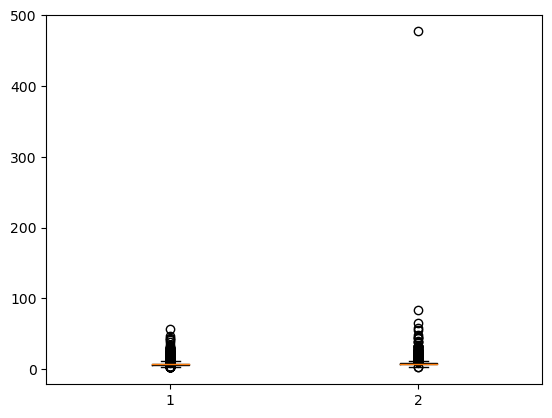

In [41]:
box_data = [gpt_df_filtered['mean_word_length_variance'], humanData_filtered['mean_word_length_variance']]
plt.boxplot(box_data)
plt.show()

In [42]:
gpt_df_filtered['mean_word_length_variance'].mean()

6.873023024496694

In [43]:
humanData_filtered['mean_word_length_variance'].mean()

7.718403806635049

In [44]:
q_low_var = gpt_df_filtered['mean_word_length_variance'].quantile(0.15)
q_high_var = gpt_df_filtered['mean_word_length_variance'].quantile(0.85)

gpt_df_filtered = gpt_df_filtered[(gpt_df_filtered['mean_word_length_variance'] < q_high_var) & (gpt_df_filtered['mean_word_length_variance'] > q_low_var)]

In [45]:
q_low_var = humanData_filtered['mean_word_length_variance'].quantile(0.15)
q_high_var = humanData_filtered['mean_word_length_variance'].quantile(0.85)

humanData_filtered = humanData_filtered[(humanData_filtered['mean_word_length_variance'] < q_high_var) & (humanData_filtered['mean_word_length_variance'] > q_low_var)]

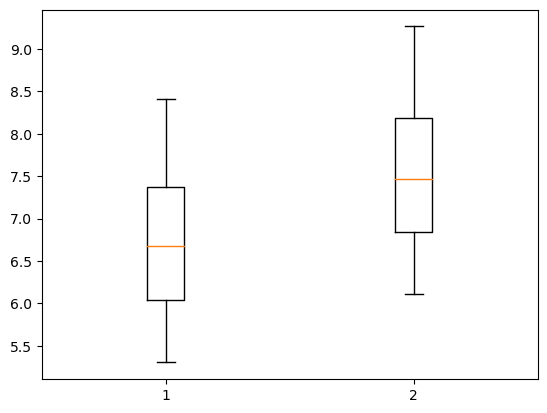

In [46]:
box_data = [gpt_df_filtered['mean_word_length_variance'], humanData_filtered['mean_word_length_variance']]
plt.boxplot(box_data)
plt.show()

In [47]:
print(gpt_df_filtered['mean_word_length_variance'].mean())
print(humanData_filtered['mean_word_length_variance'].mean())

6.725687183292381
7.5335440145570125


<AxesSubplot:ylabel='Density'>

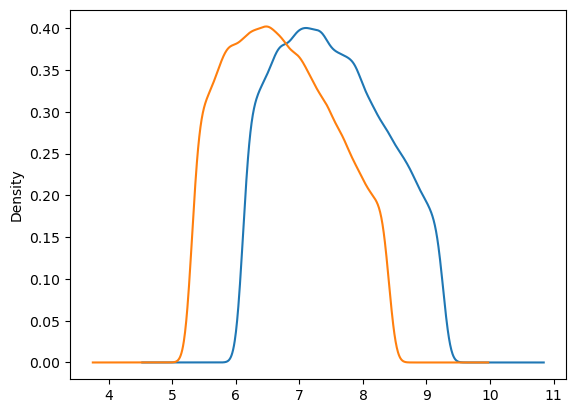

In [48]:
humanData_filtered['mean_word_length_variance'].plot.kde()
gpt_df_filtered['mean_word_length_variance'].plot.kde()

In [49]:
def z_score(sample, mu, theta):
    return (sample - mu) / theta

In [50]:
std_variability = np.std(gpt_df_filtered['sentence_var'])
mean_variabilty = np.mean(gpt_df_filtered['sentence_var'])
z_score(1495, mean_variabilty, std_variability)

-1.0848259604893653

In [51]:
std_variability = np.std(humanData_filtered['sentence_var'])
mean_variabilty = np.mean(humanData_filtered['sentence_var'])
z_score(1495, mean_variabilty, std_variability)

-1.9523858720015395

In [68]:
np.std(gpt_df_filtered['sentence_var'])

615.3654082537396

In [69]:
#Implement confidence intervals
stats.norm.interval(confidence=0.95,
                 loc=np.mean(gpt_df_filtered['sentence_var']),
                 scale=stats.sem(gpt_df_filtered['sentence_var']))

(2157.4971058741885, 2167.6316342473983)

In [70]:
stats.norm.interval(confidence=0.95,
                 loc=np.mean(gpt_df_filtered['avg_sentence_length']),
                 scale=stats.sem(gpt_df_filtered['avg_sentence_length']))

(86.30759903658414, 86.47600106379365)

In [71]:
stats.norm.interval(confidence=0.95,
                 loc=np.mean(humanData_filtered['sentence_var']),
                 scale=stats.sem(humanData_filtered['sentence_var']))

(4449.951630373312, 4474.55929465307)

In [74]:
stats.norm.interval(confidence=0.95,
                 loc=np.mean(humanData_filtered['avg_sentence_length']),
                 scale=stats.sem(humanData_filtered['avg_sentence_length']))

(112.76343360594166, 113.0047112373606)